# PilotD2Redo - QC and exploratory analysis

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import yaml
import scanpy as sc
import rapids_singlecell as rsc
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
plt.rcParams['figure.autolayout'] = True

# Increase all font sizes
plt.rcParams['font.size'] = 12  # Base font size
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 11
plt.rcParams['ytick.labelsize'] = 11
plt.rcParams['legend.fontsize'] = 11

from preprocess import _convert_oak_path
import qc_plots

/home/emmadann/.local/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Configuration

In [3]:
# Read config
experiment_name = 'PilotD2Redo'
config_file = '../../metadata/experiments_config.yaml'
with open(config_file, 'r') as f:
    config = yaml.safe_load(f)

config = config[experiment_name]
datadir = _convert_oak_path(config['datadir'])
sample_metadata_csv = _convert_oak_path(config['sample_metadata'])

PLOTDIR = f'../../results/{experiment_name}/'
sc.settings.figdir = PLOTDIR

def save_plot(pl_name, plot_dir = None):
    if plot_dir is None:
        plot_dir = PLOTDIR
    plt.savefig(f'{plot_dir}/{pl_name}.pdf');
    plt.savefig(f'{plot_dir}/{pl_name}.png');

## Read merged dataset

In [4]:
sample_metadata = pd.read_csv(sample_metadata_csv, index_col=0)
sgrna_library_metadata = pd.read_csv('../../metadata/sgRNA_library_curated.csv', index_col=0)
sample_metadata


,experiment_id,sample_id,donor_id,culture_condition,library_id,library_prep_kit
0,PilotD2Redo,PilotD2Redo_Day7,CE0010216,Day7,PilotD2Redo_Day7,GEMX_flex_v2
1,PilotD2Redo,PilotD2Redo_Rest,CE0010216,Rest,PilotD2Redo_Rest,GEMX_flex_v2
2,PilotD2Redo,PilotD2Redo_Restim6hr,CE0010216,Restim6hr,PilotD2Redo_Restim6hr,GEMX_flex_v2
3,PilotD2Redo,PilotD2Redo_Restim24hr,CE0010216,Restim24hr,PilotD2Redo_Restim24hr,GEMX_flex_v2


In [5]:
adata = sc.read_h5ad(f'{datadir}/{experiment_name}_merged.gex.lognorm.h5ad')
adata.var = adata.var[['gene_ids', 'gene_name', 'mt']].copy()
adata.var_names = adata.var[ 'gene_name'].values

In [6]:
# Load assignment of sgRNAs to cells
sgrna_assignment = pd.read_csv(f'{datadir}/sgrna_assignment.csv', index_col=0)
sgrna_assignment_index = sgrna_assignment.index.tolist()
sgrna_assignment = pd.merge(sgrna_assignment, sgrna_library_metadata.rename({"sgrna_id":'guide_id'}, axis=1), how='left')
sgrna_assignment.index = sgrna_assignment_index

existing_cols = [col for col in sgrna_assignment.columns if col in adata.obs.columns]
adata.obs.drop(columns=existing_cols, inplace=True)
adata.obs = pd.concat([adata.obs, sgrna_assignment.loc[adata.obs_names]], axis=1)
adata.obs['guide_type'] = np.where(adata.obs['guide_id'].str.startswith('NTC-'), 'non-targeting', 'targeting')

## QC metrics

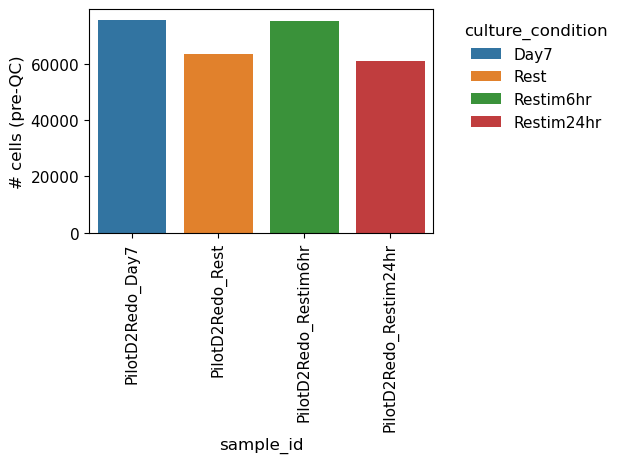

In [7]:
qc_plots.plot_ncells_sample(adata);
save_plot(f'{experiment_name}_n_cells_preQC')

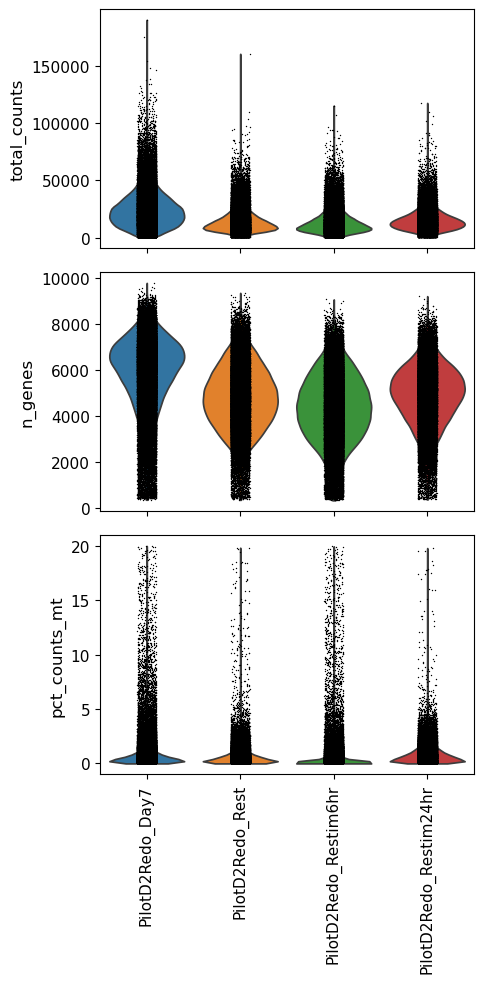

In [8]:
fig, axs = plt.subplots(3,1, figsize=(5,10))
for i,m in enumerate(['total_counts', 'n_genes', 'pct_counts_mt']):
    sc.pl.violin(adata, m, groupby='sample_id', rotation=90, show=False, ax=axs[i]);
    if i != 2:
        # remove x-axis tick labels
        axs[i].set_xticklabels([])

fig.tight_layout()
fig.show()


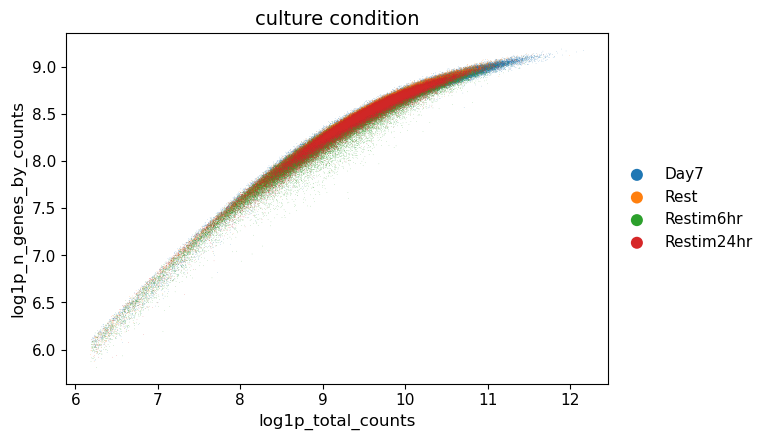

In [9]:
sc.pl.scatter(adata, 'log1p_total_counts', 'log1p_n_genes_by_counts', color='culture_condition')

In [10]:
adata.obs[['total_counts', 'n_genes', 'pct_counts_mt', 'sample_id']].groupby('sample_id').mean()

,total_counts,n_genes,pct_counts_mt
sample_id,,,
PilotD2Redo_Day7,25513.193359,5880.084336,0.820162
PilotD2Redo_Rest,14707.506836,4779.557502,0.623509
PilotD2Redo_Restim6hr,13811.750000,4351.640373,0.484242
PilotD2Redo_Restim24hr,15504.541992,4885.655684,0.835122


Estimate fraction of low quality cells (high fraction of mitochondrial genes, low number of captured genes)

In [11]:
adata.obs['low_quality'] = (adata.obs['pct_counts_mt'] > 5) | (adata.obs['n_genes'] < 1000)

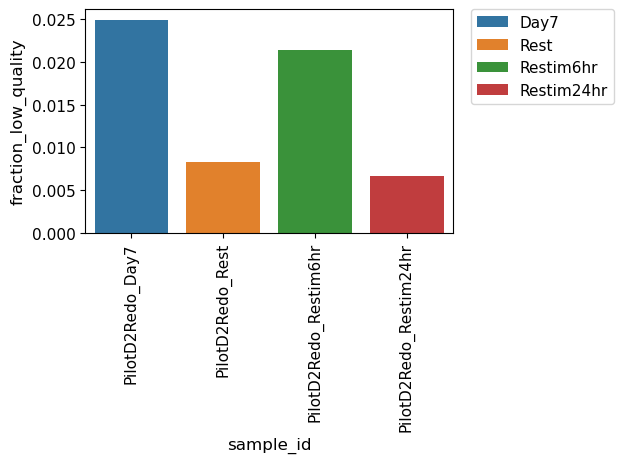

In [12]:
# plot fraction of low_quality cells for each sample_id
low_quality_df = adata.obs.groupby(['sample_id', 'culture_condition'])['low_quality'].mean().reset_index(name='fraction_low_quality')
low_quality_df
sns.barplot(data=low_quality_df, x='sample_id', y='fraction_low_quality', hue='culture_condition', dodge=False);
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.);
plt.xticks(rotation=90);


## Dimensionality reduction

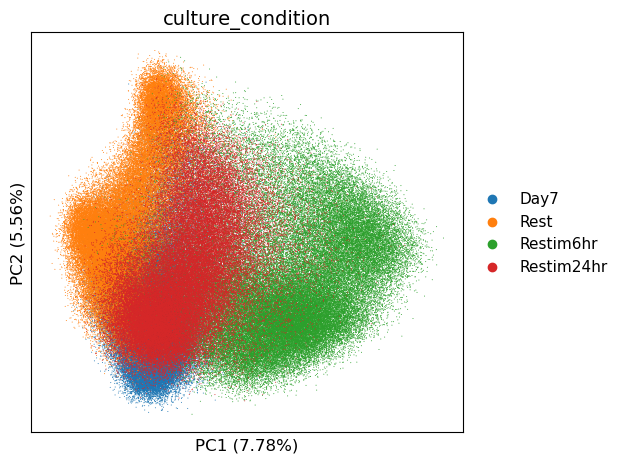

In [13]:
sc.pl.pca(adata, annotate_var_explained=True, color=['culture_condition'], components=['1,2'], wspace=0.5, ncols=3, size=2)

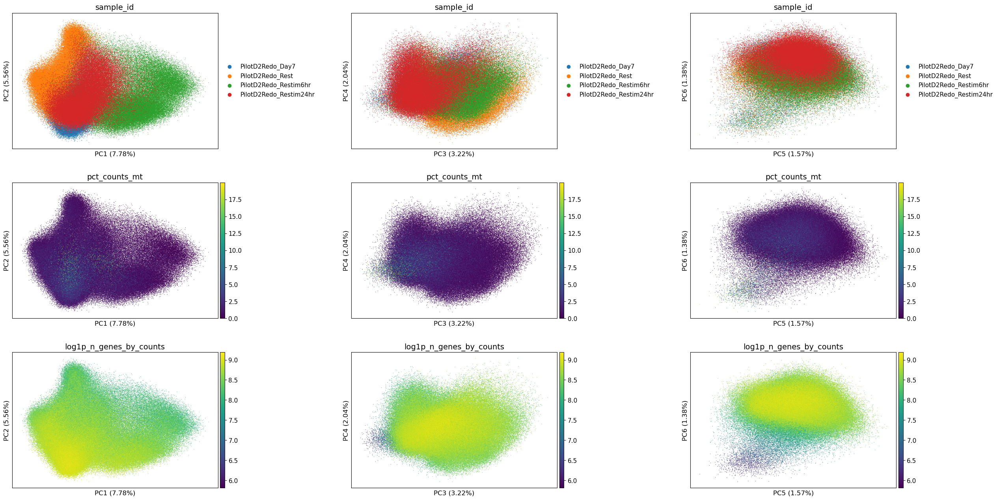

In [14]:
sc.pl.pca(adata, annotate_var_explained=True, color=['sample_id', 'pct_counts_mt', 'log1p_n_genes_by_counts'], components=['1,2', '3,4', '5,6'], wspace=0.5, ncols=3, size=3)

Visualize genes with top loadings for each PC

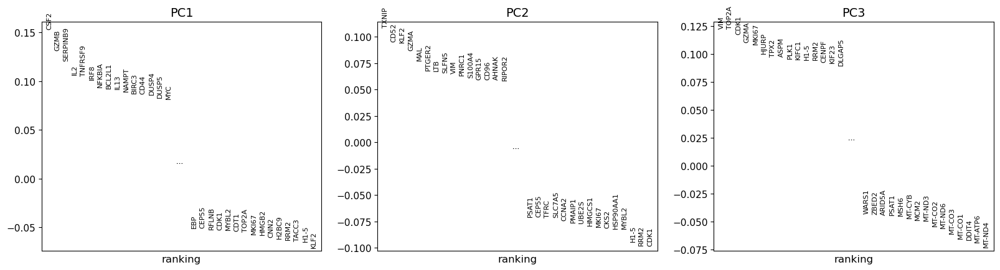

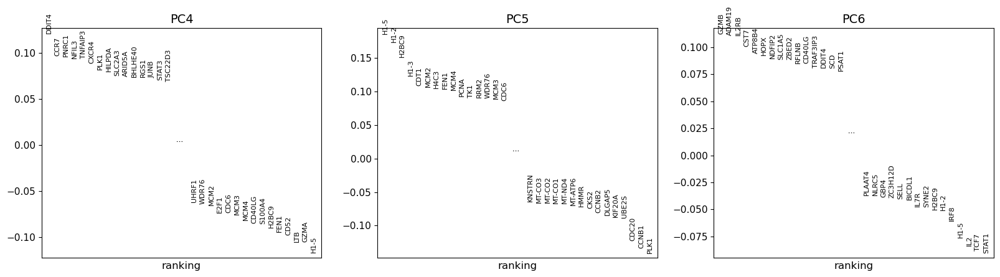

In [15]:
sc.pl.pca_loadings(adata, components='1,2,3');
sc.pl.pca_loadings(adata, components='4,5,6')

## Clustering

In [16]:
rsc.pp.neighbors(adata, n_neighbors=50)
rsc.tl.umap(adata)
rsc.tl.louvain(adata)

In [7]:
# adata.write_h5ad()

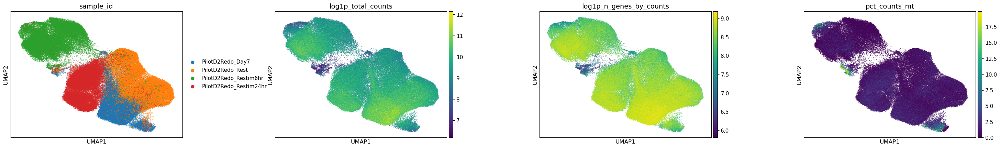

In [21]:
sc.pl.umap(adata, color=['sample_id'] + ['log1p_total_counts','log1p_n_genes_by_counts','pct_counts_mt'], wspace=0.4, size=3)

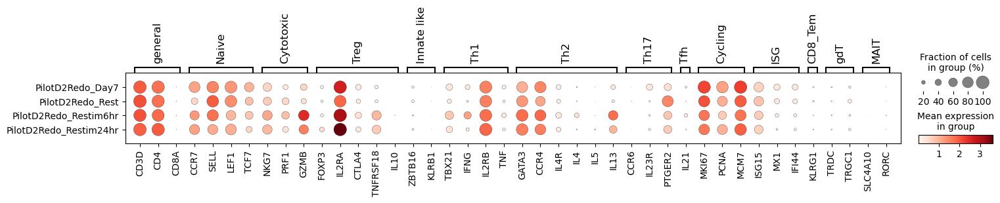

In [22]:
qc_plots.plot_markers_sample_dotplot(adata, save=f'{experiment_name}_markers_sample_dotplot')

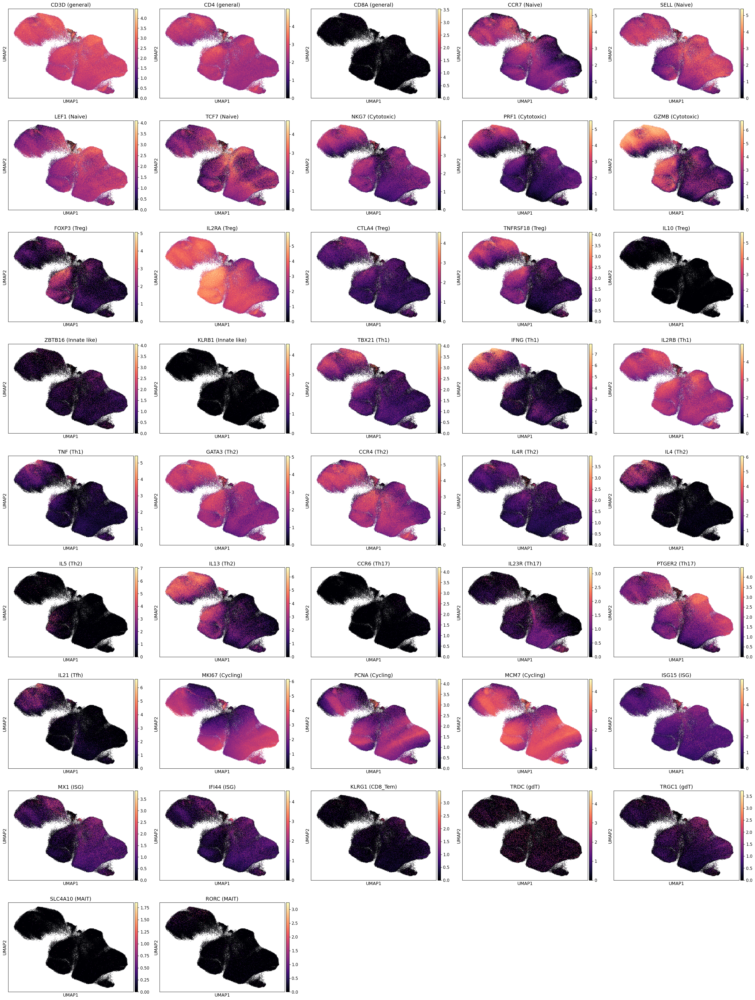

In [22]:
qc_plots.plot_markers_umap(adata, wspace=0.1, size=3, cmap='magma', ncols=5, save=f'{experiment_name}_markers.png')

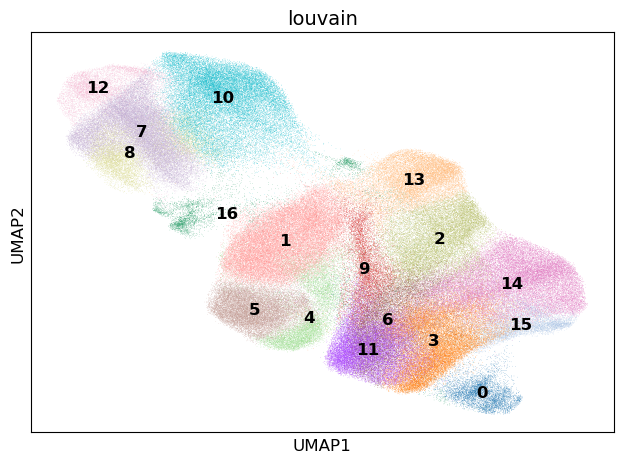

In [26]:
sc.pl.umap(adata, color='louvain', legend_loc='on data')

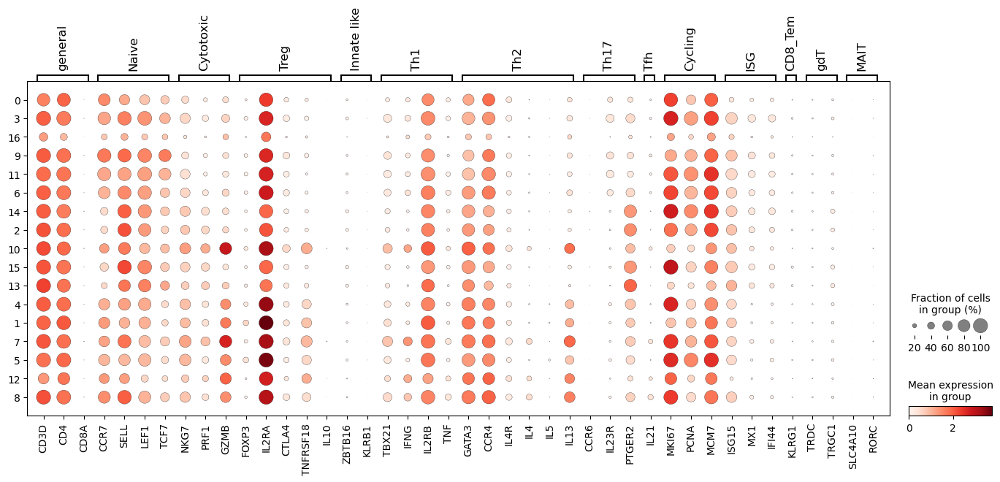

In [25]:
group_by = 'culture_condition'
markers_dict = qc_plots.load_Tcell_markers(adata)
order_samples = adata.obs.sort_values([group_by])['louvain'].astype(str).unique()
adata.obs['louvain'] = adata.obs['louvain'].cat.reorder_categories(order_samples)
sc.pl.dotplot(adata, markers_dict, groupby='louvain')


## Knock-down efficiency

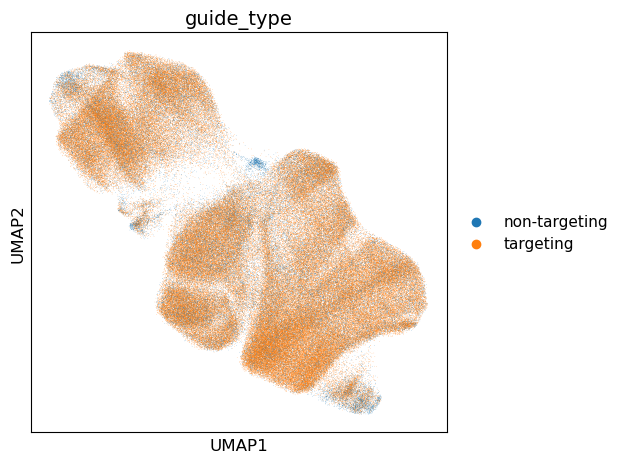

In [27]:
sc.pl.umap(adata, color='guide_type')

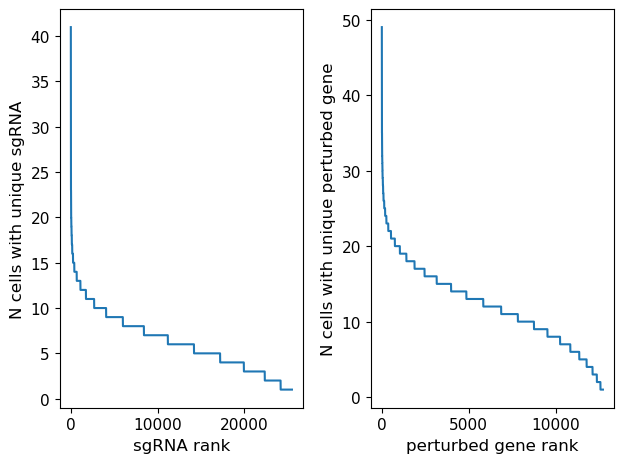

In [28]:
guide_cell_counts = adata.obs['guide_id'].value_counts()
guide_cell_counts.index = guide_cell_counts.index.astype(str)
plt.subplot(1,2,1);
plt.plot(guide_cell_counts[1:].values);
plt.xlabel('sgRNA rank');
plt.ylabel('N cells with unique sgRNA');


gene_cell_counts = adata.obs['perturbed_gene_name'].value_counts()
gene_cell_counts.index = gene_cell_counts.index.astype(str)

plt.subplot(1,2,2);
plt.plot(gene_cell_counts[1:].values);
plt.xlabel('perturbed gene rank');
plt.ylabel('N cells with unique perturbed gene');

In [35]:
perturbed_gene_expr_df = qc_plots.calculate_perturbed_gene_expression(adata)
kd_results_c = qc_plots.test_knockdown_simple(perturbed_gene_expr_df)

In [45]:
kd_results_c['signif_knockdown'].value_counts().sum()

12712

In [38]:
kd_results_c.to_csv(f'{datadir}/knockdown_efficacy_simple.csv')

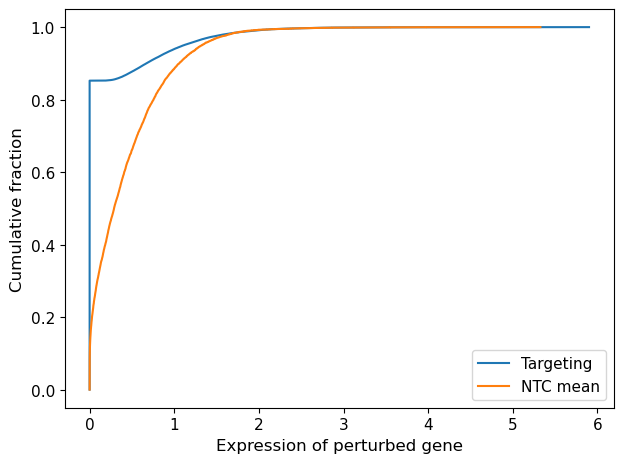

In [50]:
# Plot cumulative distributions
plt.plot(np.sort(perturbed_gene_expr_df['perturbed_gene_expr']),
         np.linspace(0, 1, len(perturbed_gene_expr_df['perturbed_gene_expr'])), label='Targeting')
plt.plot(np.sort(perturbed_gene_expr_df['perturbed_gene_mean_ntc']),
         np.linspace(0, 1, len(perturbed_gene_expr_df['perturbed_gene_mean_ntc'])), label='NTC mean')
plt.xlabel('Expression of perturbed gene');
plt.ylabel('Cumulative fraction');
plt.legend()

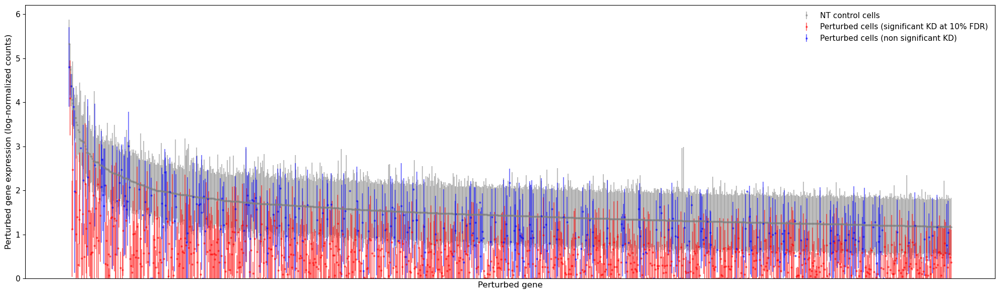

In [40]:
mean_perturbed_gene_expr_df = kd_results_c
order_genes = mean_perturbed_gene_expr_df.sort_values('perturbed_gene_mean_ntc', ascending=False).perturbed_gene.astype(str).values
mean_perturbed_gene_expr_df['perturbed_gene'] = pd.Categorical(mean_perturbed_gene_expr_df['perturbed_gene'], categories=order_genes, ordered=True)

pl_df = mean_perturbed_gene_expr_df[mean_perturbed_gene_expr_df['perturbed_gene'].isin(order_genes[0:1000])].sort_values('perturbed_gene')
plt.figure(figsize=(20,6))
# Plot mean NTC expression with error bars
plt.errorbar(pl_df['perturbed_gene'],
             pl_df['perturbed_gene_mean_ntc'], 
             yerr=pl_df['perturbed_gene_std_ntc'],
             fmt='o',
             color='grey',
             markersize=2,
             alpha=0.5,
             label='NT control cells')

# Add stripplot of perturbed expression
plt.errorbar(pl_df[pl_df.signif_knockdown]['perturbed_gene'],
           pl_df[pl_df.signif_knockdown]['perturbed_gene_expr'],
           yerr=pl_df[pl_df.signif_knockdown]['perturbed_gene_expr_std'],
           fmt='o',
           markersize=2,
           color='red',
           alpha=0.5,
           label='Perturbed cells (significant KD at 10% FDR)')
plt.errorbar(pl_df[~pl_df.signif_knockdown]['perturbed_gene'],
           pl_df[~pl_df.signif_knockdown]['perturbed_gene_expr'],
           yerr=pl_df[~pl_df.signif_knockdown]['perturbed_gene_expr_std'],
           fmt='o',
           markersize=2,
           color='blue',
           alpha=0.5,
           label='Perturbed cells (non significant KD)')

plt.xticks([])
plt.ylim(0)
plt.xlabel('Perturbed gene')
plt.ylabel('Perturbed gene expression (log-normalized counts)')
plt.legend(frameon=False);
plt.tight_layout()

Text(0, 0.5, 'Perturbed gene expression (log-normalized counts)')

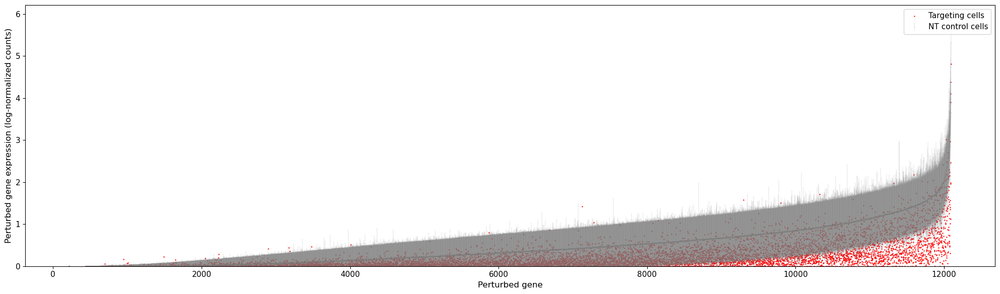

In [70]:
plt.figure(figsize=(20,6))
mean_perturbed_gene_expr_df['rank'] = mean_perturbed_gene_expr_df['perturbed_gene_mean_ntc'].rank()
# # Plot mean NTC expression with error bars
plt.errorbar(mean_perturbed_gene_expr_df['rank'],
             mean_perturbed_gene_expr_df['perturbed_gene_mean_ntc'], 
             yerr=mean_perturbed_gene_expr_df['perturbed_gene_std_ntc'],
             fmt='o',
             color='grey',
             markersize=1, 
             alpha=0.1,
             label='NT control cells')
# # Add stripplot of perturbed expression
# plt.errorbar(mean_perturbed_gene_expr_df['rank'],
#            mean_perturbed_gene_expr_df['perturbed_gene_expr'],
#            yerr=mean_perturbed_gene_expr_df['perturbed_gene_expr_std'],
#            fmt='o',
#              markersize=1, 
#              alpha=0.1,
#            color='red',
#            label='Perturbed cells (significant KD at 10% FDR)')
# # plt.errorbar(mean_perturbed_gene_expr_df[~mean_perturbed_gene_expr_df.signif_knockdown]['rank'],
# #            mean_perturbed_gene_expr_df[~mean_perturbed_gene_expr_df.signif_knockdown]['perturbed_gene_expr'],
# #            yerr=mean_perturbed_gene_expr_df[~mean_perturbed_gene_expr_df.signif_knockdown]['perturbed_gene_expr_std'],
# #            fmt='o',
# #             markersize=1, 
# #              alpha=0.1,
# #            color='blue',
# #            label='Perturbed cells (non significant KD)')

# sns.scatterplot(y=mean_perturbed_gene_expr_df['perturbed_gene_mean_ntc'], x=mean_perturbed_gene_expr_df['perturbed_gene_mean_ntc'].rank(), s=1, color='grey', label='NTC cells', linewidth=0);
sns.scatterplot(y=mean_perturbed_gene_expr_df['perturbed_gene_expr'], x=mean_perturbed_gene_expr_df['perturbed_gene_mean_ntc'].rank(), s=3, label='Targeting cells', color='red', linewidth=0);
plt.ylim(0)
plt.xlabel('Perturbed gene')
plt.ylabel('Perturbed gene expression (log-normalized counts)')


In [34]:
all_conditions = adata.obs['culture_condition'].unique()
all_conditions_tests = {}
for c in all_conditions:
    print(c)
    ad_c = adata[adata.obs['culture_condition'] == c].copy()
    perturbed_gene_expr_df = qc_plots.calculate_perturbed_gene_expression(ad_c)
    kd_results_c = qc_plots.test_knockdown_simple(perturbed_gene_expr_df)
    kd_results_c['culture_condition'] = c
    all_conditions_tests[c] = kd_results_c

Day7
Rest
Restim6hr
Restim24hr


In [72]:
for k in all_conditions_tests.keys():
    print(all_conditions_tests[k].signif_knockdown.value_counts())

signif_knockdown
True     5985
False    5911
Name: count, dtype: int64
signif_knockdown
True     5704
False    5620
Name: count, dtype: int64
signif_knockdown
True     6255
False    5390
Name: count, dtype: int64
signif_knockdown
True     5551
False    5538
Name: count, dtype: int64
